In [1]:
import networkx as nx
import string
import matplotlib.pyplot as plt
import osmnx as ox
import pandas as pd

def generate_streetnetwork(centerpoint, distance):

    """
    Load a network from OSMNX which will be used for the simulation runs. The generated network is from Rotterdam.
    Returns
    -------
    G: network MultiGraph
        Network Graph with different attributes:
            Nodes and Edges with LineString with coordinates,
            Edges have properties Speed, Travel time, Length.

    """
    lonlat=     centerpoint                                 #coordinates of the city centre of Rotterdam
    distance =  distance                                        #distance in meters from the coordinates.
    roadtype=   "drive"                                     #select only roads which are driveable by the car.

    # cf = '["highway"~"primary"]'
    # cf = '["highway"~"motorway|primary|secondary"]'
    # cf = '["highway"~"motorway|motorway_link|trunk|trunk_link|primary|secondary"]'

    ox.settings.log_console=True
    ox.settings.use_cache=True
    # ox.config(use_cache=True, log_console=True)

    # download street network data from OSM and construct a MultiDiGraph model
    #G = ox.graph_from_point(lonlat, dist=distance, network_type=roadtype)
    G = ox.graph_from_address(lonlat, dist=distance, network_type='drive', simplify=True)  #, custom_filter=cf

    G = ox.add_edge_speeds(G)
    G = ox.add_edge_travel_times(G, precision=0)

    return G

In [2]:
def save_graph(G, centerpoint, distance):
    filepath=f"graphs/simopt/Graph_{centerpoint}_{distance}.graph.graphml"
    # ox.save_graph_geopackage(G, filepath=filepath)
    ox.save_graphml(G,filepath)

In [3]:
# def draw_edges(graph, fugitive_routes):
#     edges_fugitive = []
#
#     for i_r, route_time in enumerate(fugitive_routes):
#         route = list(route_time.values())
#         for i, node in enumerate(route):
#             if i ==0:
#                 continue
#             else:
#                 edges_fugitive1 = [(route[i], route[i-1])]
#                 edges_fugitive2 = [(route[i-1], route[i])]
#                 edges_fugitive.extend(tuple(edges_fugitive1))
#                 edges_fugitive.extend(tuple(edges_fugitive2))
#
#     edge_colormap = ['lightgray'] * len(graph.edges())
#     edge_weightmap = [1] * len(graph.edges())
#     for index, edge in enumerate(graph.edges()):
#         if edge in edges_fugitive:
#             edge_colormap[index] = 'tab:orange'
#             edge_weightmap[index] = 2
#
#     return edge_colormap, edge_weightmap

In [4]:
def draw_edges(graph):
    edges_fugitive = []

    edge_colormap = ['lightgray'] * len(graph.edges())
    edge_weightmap = [1] * len(graph.edges())

    return edge_colormap, edge_weightmap

In [5]:
import pandas as pd
def show_graph(centerpoint, distance):
    filepath=f"graphs/simopt/Graph_{centerpoint}_{distance}.graph.graphml"
    G = ox.load_graphml(filepath=filepath)

    config = 3

    # fugitive_routes = pd.read_pickle(f'../../simopt/data/Rotterdam/nodes/fugitive_routes_N{distance}_R500_U5_config{config}.pkl')
    # police_nodes = pd.read_pickle(f'../../simopt/data/Rotterdam/nodes/units_start_N{distance}_R500_U5_config{config}.pkl')
    # edge_colormap, edge_weightmap = draw_edges(G, fugitive_routes)
    edge_colormap, edge_weightmap = draw_edges(G)

    node_size = []
    node_color = []
    # for node in G.nodes:
    #     if node == fugitive_routes[0][0]:
    #         node_size.append(150)
    #         node_color.append('tab:orange')
    #     elif node in police_nodes:
    #         node_size.append(150)
    #         node_color.append('tab:blue')
    #     else:
    #         node_size.append(0)
    #         node_color.append('lightgray')

    for node in G.nodes:
        node_size.append(0)
        node_color.append('lightgray')

    fig, ax = ox.plot_graph(
                G, bgcolor="white", node_color=node_color, node_size=node_size, edge_linewidth=edge_weightmap, edge_color=edge_colormap,
                save=True, filepath=f'graphs/Rotterdam/Graph_{centerpoint}_{distance}_fugitiveroutes.png'
                )
    # ax.savefig('graphs/Rotterdam/Graph_{centerpoint}_{distance}_fugitiveroutes.png')

In [6]:
def get_furthest_nodes(G):
    sp_length = {} # dict containing shortest path distances for each pair of nodes
    diameter = None # will contain the graphs diameter (length of longest shortest path)
    furthest_node_list = [] # will contain list of tuple of nodes with shortest path equal to diameter

    for node in G.nodes:
        # Get the shortest path from node to all other nodes
        sp_length[node] = nx.shortest_path_length(G,node, weight='travel_time')
        longest_path = max(sp_length[node].values()) # get length of furthest node from node

        # Update diameter when necessary (on first iteration and when we find a longer one)
        if diameter == None:
            diameter = longest_path # set the first diameter

        # update the list of tuples of furthest nodes if we have a best diameter
        if longest_path >= diameter:
            diameter = longest_path


    # return the diameter,
        # all pairs of nodes with shortest path length equal to the diameter
        # the dict of all-node shortest paths
    return diameter

In [7]:
# city = ("Lelystad")
# distance = 2400
#
# G=generate_streetnetwork(city, distance)
# save_graph(G, city, distance)
#
# print(len(G.nodes()))

# show_graph(city, distance)

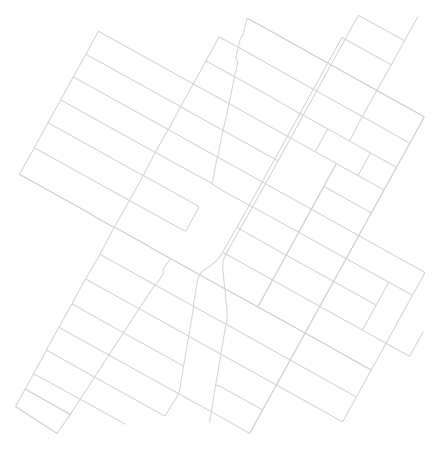

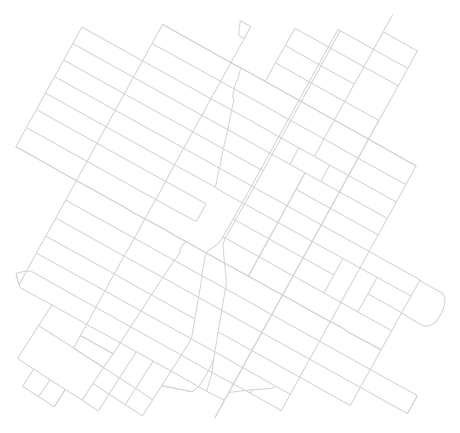

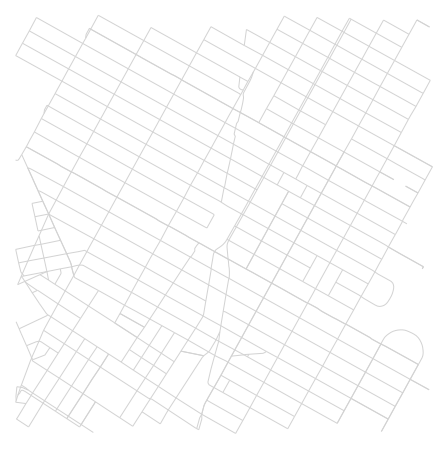

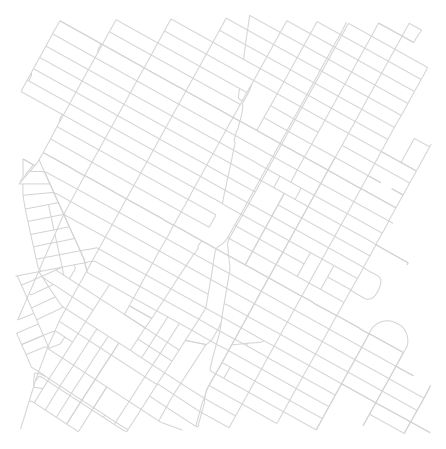

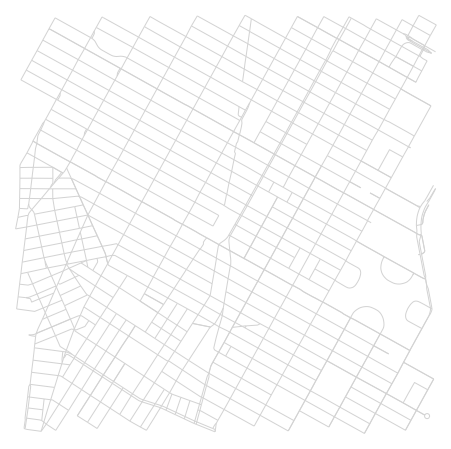

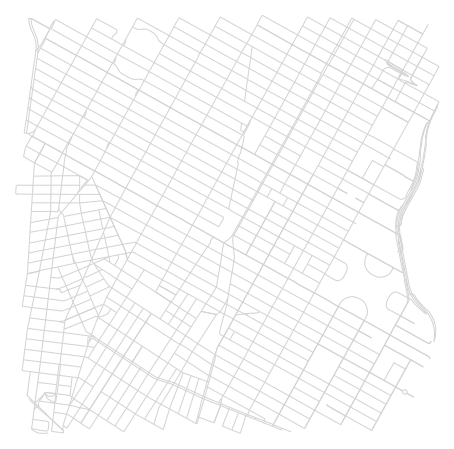

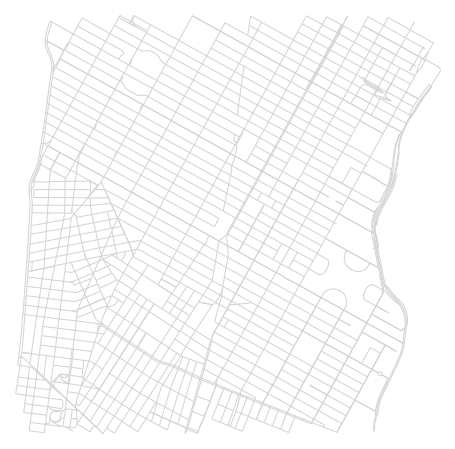

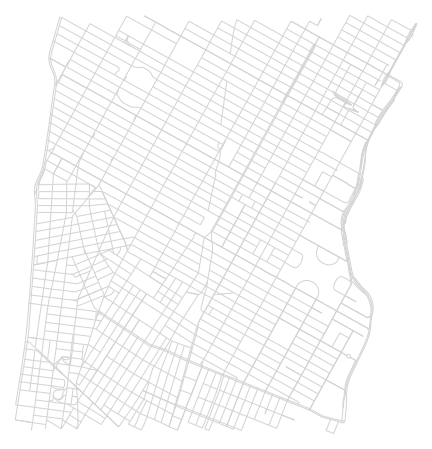

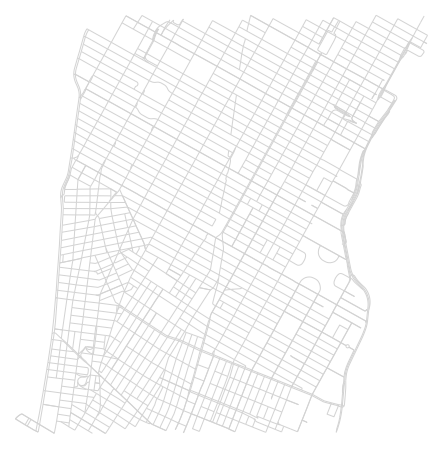

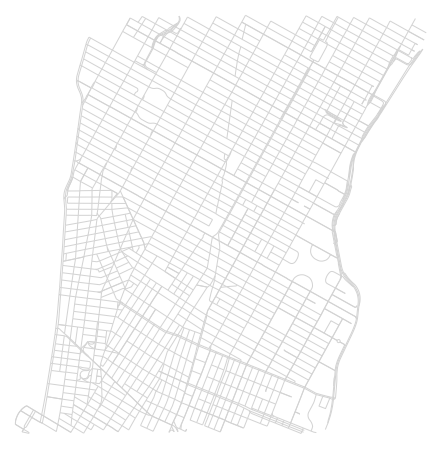

In [8]:
# city = ("Amsterdam")
city = ('Union Square, New York City')
# city = ('Barcelona')
for distance in [600, 800, 1100, 1200, 1400, 1600, 1800, 2000, 2200, 2300]:
# for distance in [1200, 1400, 1600, 1800]:
# for distance in [1100]:
    G=generate_streetnetwork(city, distance)

    save_graph(G, city, distance)
    # print(distance, ': ', len(G.nodes()))
    # print(distance, ': ', distance/5)

    # print('distance: ', get_furthest_nodes(G))

    show_graph(city, distance)

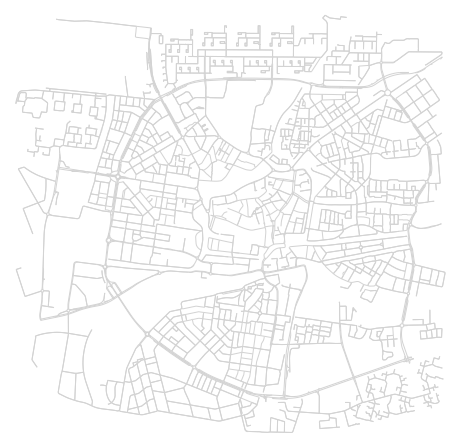

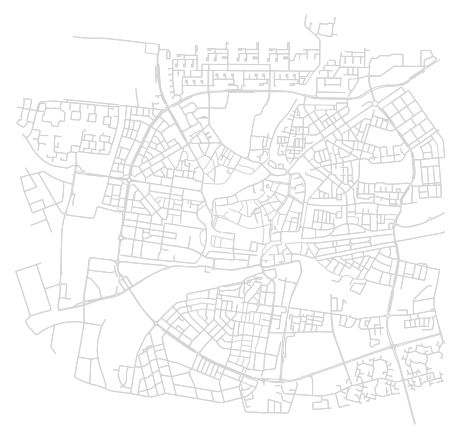

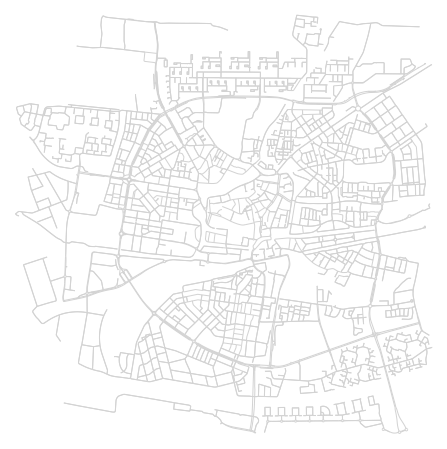

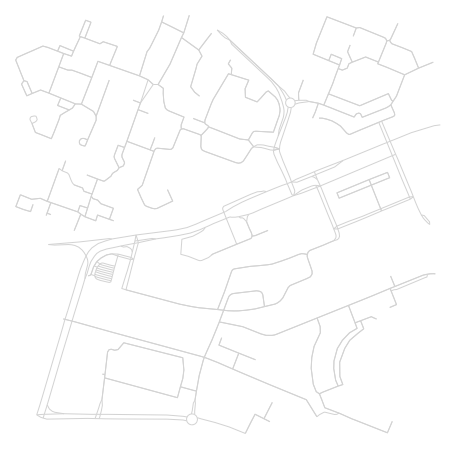

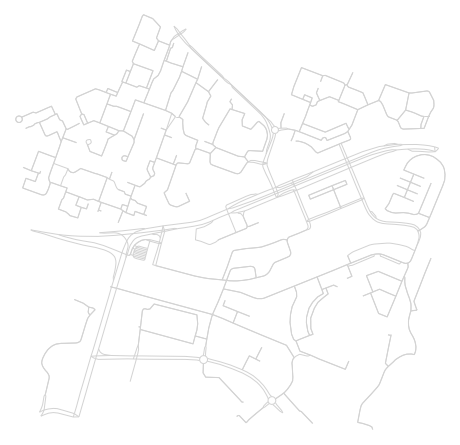

...

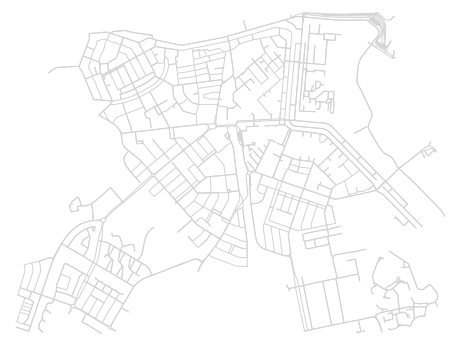

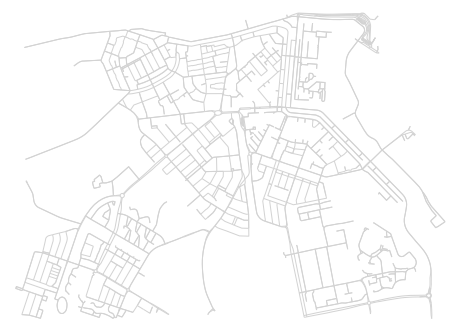

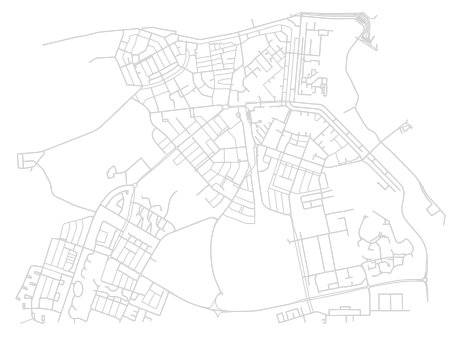

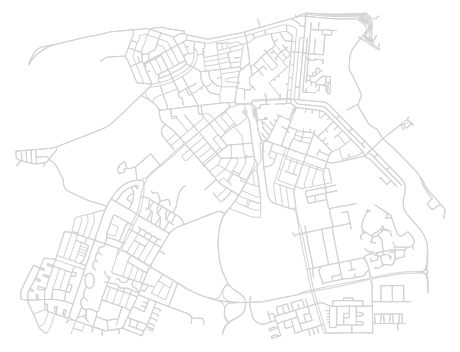

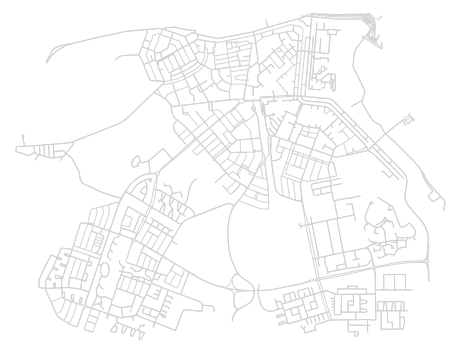

In [29]:
# city = ("Amsterdam")
# city = ('Noordereiland, Rotterdam')
# city = ('Barcelona')

from collections import defaultdict

# nodes_dict = defaultdict(lambda: defaultdict(list))
# nodes_dict = defaultdict(lambda: defaultdict(dict))
nodes_dict = defaultdict(dict)
for city in ['Noordereiland, Rotterdam', 'Penn station, New York City', 'Leeuwarden', 'Zoetermeer', 'Venlo', 'Delfzijl', '52.9579760, 4.7602790']:
    for distance in [600, 800, 1100, 1200, 1400, 1600, 1800, 2000, 2200, 2300]:
        G=generate_streetnetwork(city, distance)

        save_graph(G, city, distance)
        # print(distance, ': ', len(G.nodes()))
        # print(distance, ': ', distance/5)

        # print('distance: ', get_furthest_nodes(G))
        nodes_dict[city][distance] = len(G.nodes)
        show_graph(city, distance)

In [30]:
nodes_dict

defaultdict(dict,
            {'Noordereiland, Rotterdam': {600: 140,
              800: 256,
              1100: 530,
              1200: 689,
              1400: 957,
              1600: 1208,
              1800: 1541,
              2000: 1872,
              2200: 2264,
              2300: 2514},
             'Penn station, New York City': {600: 88,
              800: 183,
              1100: 352,
              1200: 415,
              1400: 551,
              1600: 741,
              1800: 877,
              2000: 1008,
              2200: 1139,
              2300: 1215},
             'Leeuwarden': {600: 327,
              800: 565,
              1100: 1107,
              1200: 1278,
              1400: 1564,
              1600: 1884,
              1800: 2315,
              2000: 2511,
              2200: 2645,
              2300: 2835},
             'Zoetermeer': {600: 252,
              800: 368,
              1100: 705,
              1200: 861,
              1400: 1161,
         

In [31]:
import pickle
# Store data (serialize)
with open('graphs/simopt/nodes_dict.pickle', 'wb') as handle:
    pickle.dump(nodes_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

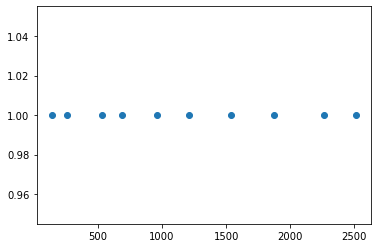

In [22]:
my_dict = {# 500 :  77,
            600 :  140,
            # 700 :  198,
            800 :  256,
            # 900 :  322,
            # 1000 :  389,
            1100 : 530,
            1200 :  689,
            1400 :  957,
            1600 :  1208,
            1800 :  1541,
            2000 :  1872,
            2200 :  2264,
            2300 : 2514
            # 2400 :  2753
}

plt.scatter(y=[1]*len(my_dict), x=my_dict.values())

In [23]:
gdf = ox.geocode_to_gdf('Rotterdam').centroid
print(gdf.y, gdf.x)

0    51.922499
dtype: float64 0    4.486541
dtype: float64


C:\Users\isvandroffelaa\AppData\Local\Temp\ipykernel_11544\667074004.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf = ox.geocode_to_gdf('Rotterdam').centroid


In [24]:
gdf = ox.geocode_to_gdf('Rotterdam').centroid
print(gdf.y, gdf.x)

0    51.922499
dtype: float64 0    4.486541
dtype: float64


C:\Users\isvandroffelaa\AppData\Local\Temp\ipykernel_11544\667074004.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf = ox.geocode_to_gdf('Rotterdam').centroid


In [25]:
G.edges(data=True)

OutMultiEdgeDataView([(26911590, 44412339, {'osmid': 7521379, 'lanes': '1', 'name': 'Achterklooster', 'highway': 'residential', 'maxspeed': '30', 'oneway': False, 'reversed': False, 'length': 115.11, 'speed_kph': 30.0, 'travel_time': 14.0}), (26911590, 44409291, {'osmid': 7523166, 'lanes': '1', 'name': 'Kipstraat', 'highway': 'residential', 'maxspeed': '30', 'oneway': False, 'reversed': True, 'length': 28.554, 'speed_kph': 30.0, 'travel_time': 3.0}), (26911590, 44408715, {'osmid': 7523171, 'lanes': '1', 'name': 'Mariniershof', 'highway': 'residential', 'maxspeed': '30', 'oneway': False, 'reversed': True, 'length': 97.694, 'speed_kph': 30.0, 'travel_time': 12.0}), (29382868, 44293535, {'osmid': 7515735, 'name': 'Sint-Janshaven', 'highway': 'residential', 'maxspeed': '30', 'oneway': False, 'reversed': True, 'length': 64.83, 'geometry': <shapely.geometry.linestring.LineString object at 0x000002163D574A60>, 'speed_kph': 30.0, 'travel_time': 9.0}), (29620781, 44399997, {'osmid': [7526728, 6

In [26]:
ox.geometries.geometries_from_address('Rotterdam', dist=2500).centroid

TypeError: geometries_from_address() missing 1 required positional argument: 'tags'

In [ ]:
city = 'Rotterdam'

osmnx_center_node = ox.distance.nearest_nodes(G=G, Y=casa_de_moneda[0], X=casa_de_moneda[1])


node_size = []
node_color = []
for node in G.nodes:
    if node == casa_de_moneda_node:
        node_size.append(80)
        node_color.append('tab:orange')
    else:
        node_size.append(0)
        node_color.append('blue')
save_filepath = 'graphs/MexicoCityGraph_3km.png'
fig, ax = ox.plot_graph(
    G, bgcolor="white", node_color=node_color, node_size=node_size, edge_linewidth=1, edge_color='lightgray',
    save=True, filepath= save_filepath
            )

In [3]:
filepath=f"graphs/FLEE/Graph_FLEE.graph.graphml"
G = ox.load_graphml(filepath=filepath)

NameError: name 'ox' is not defined